<a href="https://colab.research.google.com/github/kleineidam/LeafTransport/blob/main/arena_tracking_imagesubtraction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.0/178.0 kB 12.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
Processed frame 100


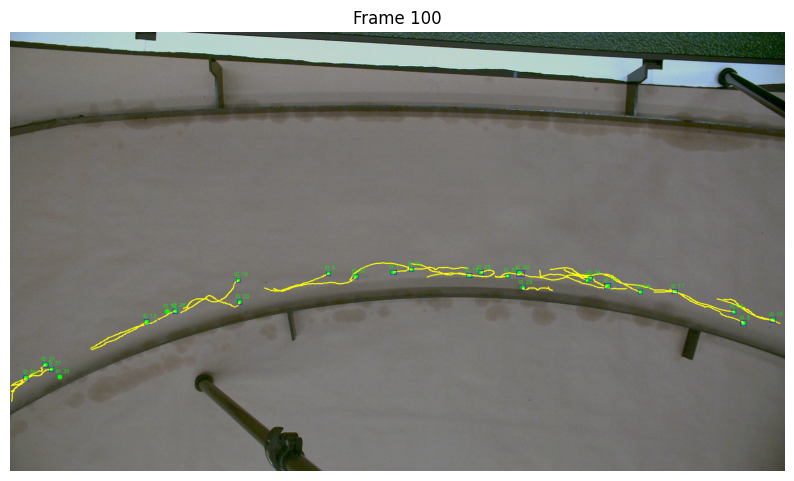

Processed frame 200


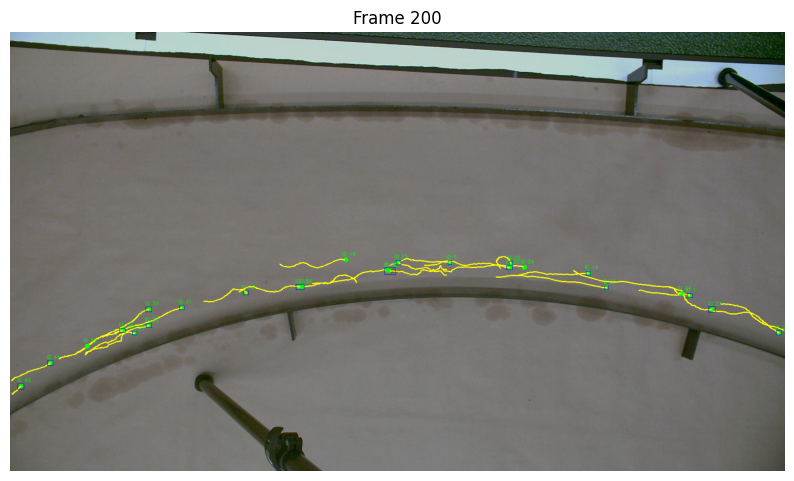

Processed frame 300


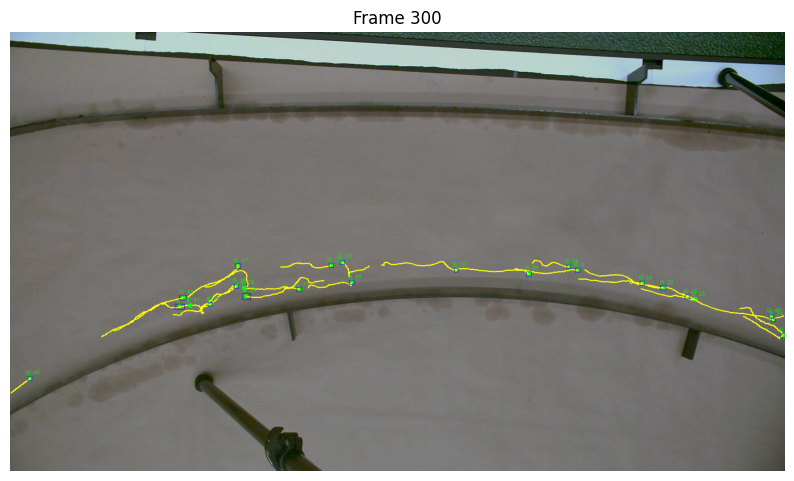

Processed frame 400


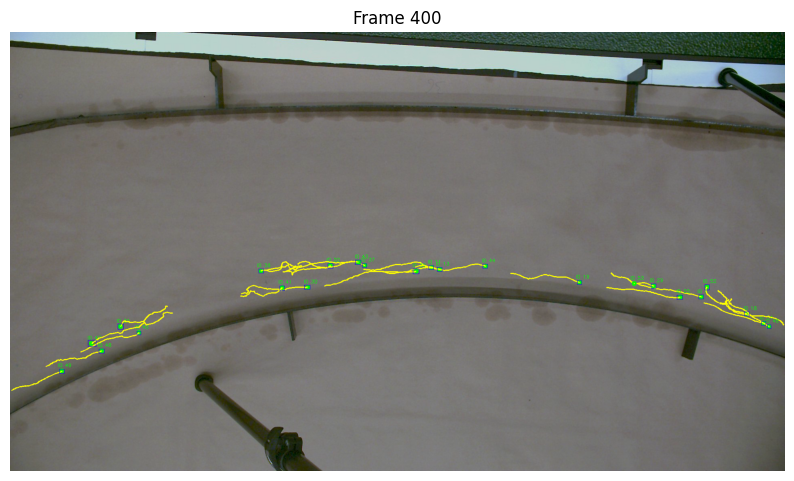

Processed frame 500


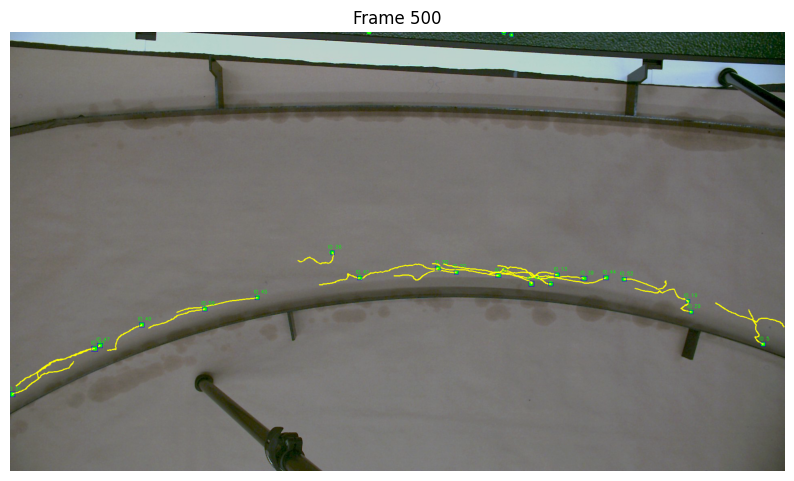

Processed frame 600


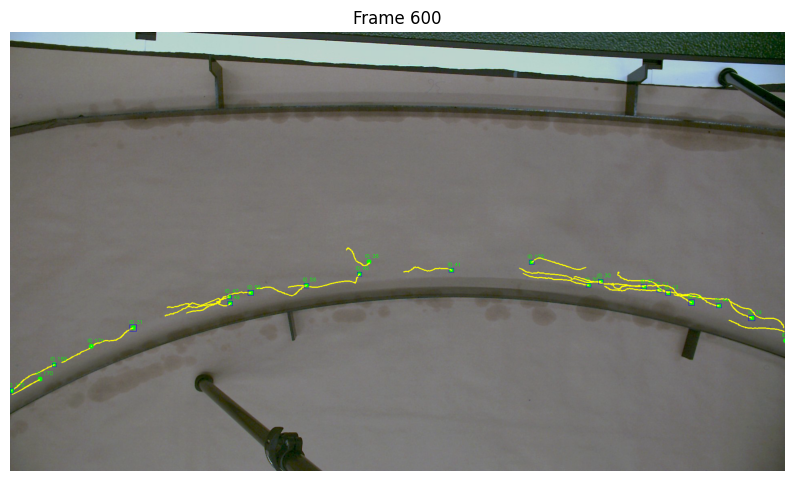

Processed frame 700


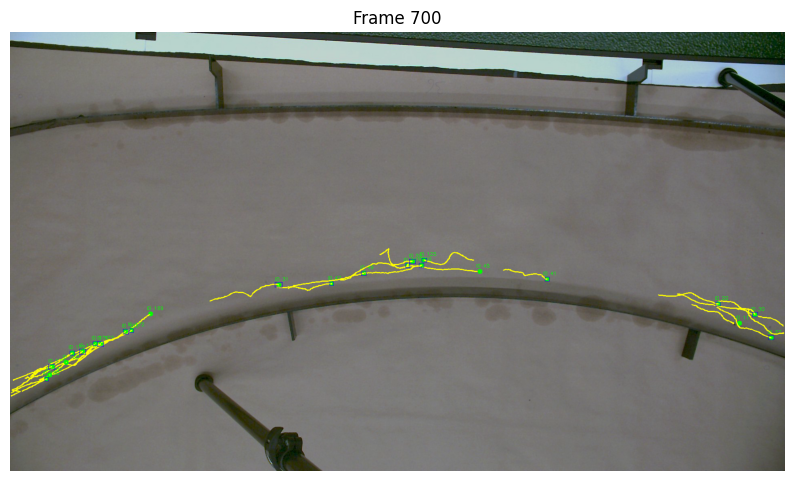

Processed frame 800


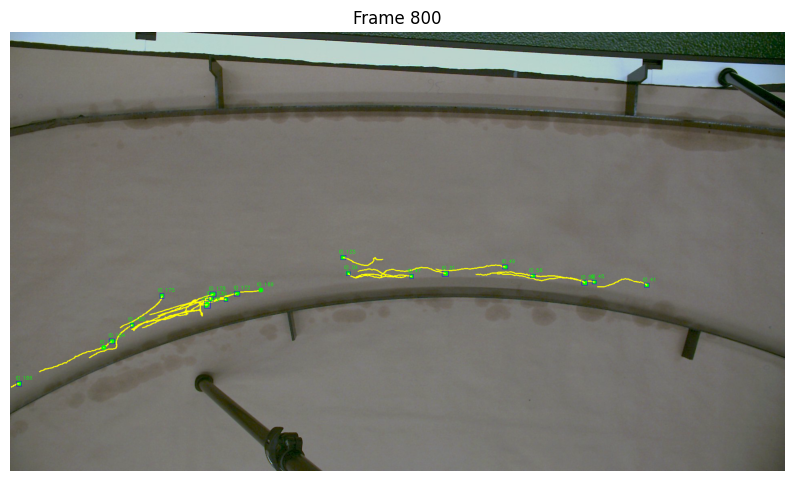

Processed frame 900


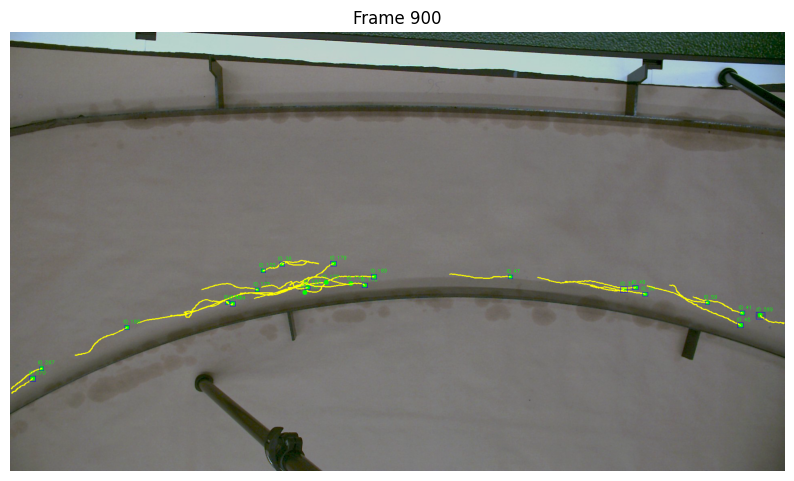

Processed frame 1000


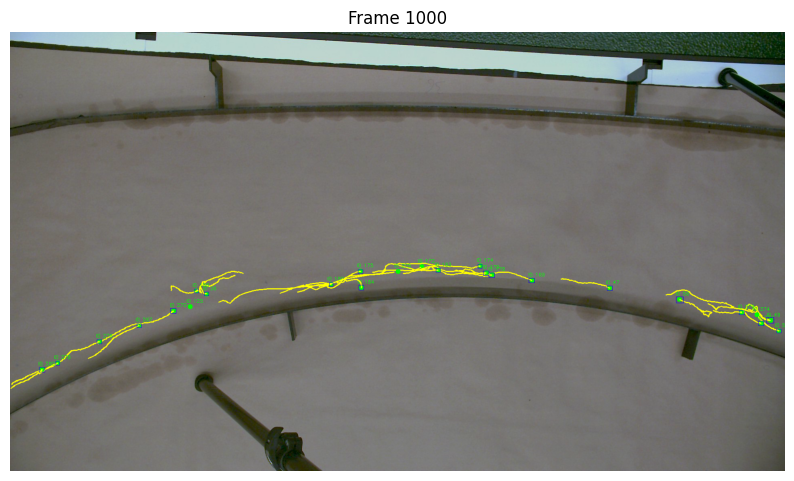

Processed frame 1100


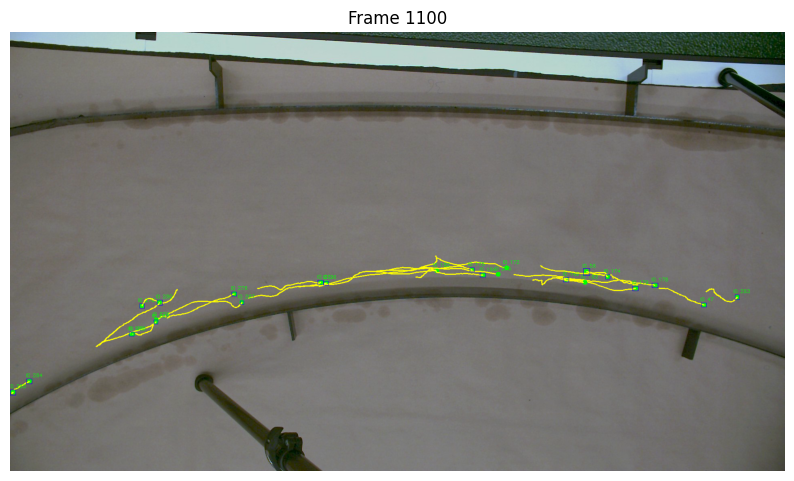

Processed frame 1200


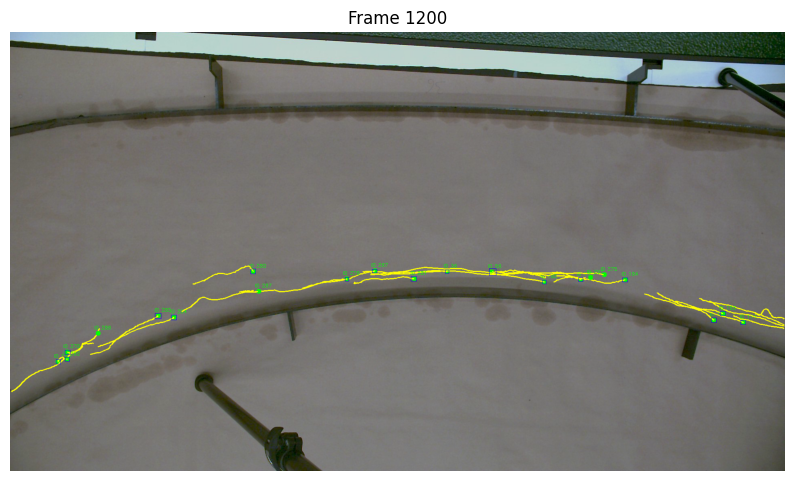

Tracking complete. Total frames processed: 1200
Tracking results saved to: /content/drive/MyDrive/arena_project/tracking_runs/run_20250829-100237/tracked_ants_kf_results.csv


,frame,track_id,x,y,w,h,cx,cy
0,2,1,1695,679,11,10,1700,684
1,2,2,1568,68,352,73,1744,104
2,2,3,0,0,1570,125,785,62
3,4,1,1686,677,11,10,1691,682
4,4,4,1770,700,10,10,1775,705


In [2]:
# Install dependencies
!pip install --quiet opencv-python-headless filterpy

import cv2
import numpy as np
import pandas as pd
from scipy.optimize import linear_sum_assignment
from filterpy.kalman import KalmanFilter
import matplotlib.pyplot as plt
import os
import time

# === User parameters ===
video_path = "/content/drive/MyDrive/arena_project/arena_videos/cropped_video.avi"
min_contour_area = 20     # minimum area for a detection to count
max_distance = 40         # max allowed assignment distance (pixels)
max_missing_frames = 30   # max frames track can be missing before deletion (~1 second at 30fps)

# === Create unique output folder and file names ===
timestamp = time.strftime("%Y%m%d-%H%M%S")
output_dir = f"/content/drive/MyDrive/arena_project/tracking_runs/run_{timestamp}"
os.makedirs(output_dir, exist_ok=True)
video_outfile = os.path.join(output_dir, "tracked_ants_kf.mp4")
csv_outfile = os.path.join(output_dir, "tracked_ants_kf_results.csv")

# === Define Track class with Kalman Filter ===
class Track:
    def __init__(self, track_id, initial_pos):
        self.id = track_id
        self.kf = self.create_kalman_filter(initial_pos)
        self.skipped_frames = 0
        self.trace = [initial_pos]  # history of tracked positions

    def create_kalman_filter(self, pos):
        kf = KalmanFilter(dim_x=4, dim_z=2)
        dt = 1.0
        kf.F = np.array([[1, 0, dt, 0],
                         [0, 1, 0, dt],
                         [0, 0, 1, 0],
                         [0, 0, 0, 1]])
        kf.H = np.array([[1, 0, 0, 0],
                         [0, 1, 0, 0]])
        kf.R *= 0.1  # measurement noise
        kf.P *= 10   # estimate covariance
        kf.Q = np.eye(4) * 0.01  # process noise

        kf.x[:2] = np.array([[pos[0]], [pos[1]]])
        kf.x[2:] = 0.0
        return kf

    def predict(self):
        self.kf.predict()
        pred = self.kf.x[:2].reshape(2)
        return pred

    def update(self, pos):
        self.kf.update(np.array(pos))
        self.trace.append(pos)
        if len(self.trace) > 50:
            self.trace.pop(0)
        self.skipped_frames = 0

    def increment_skipped(self):
        self.skipped_frames += 1

def iou_cost_matrix(tracks, detections):
    cost_matrix = np.zeros((len(tracks), len(detections)), dtype=np.float32)
    for i, track in enumerate(tracks):
        pred_pos = track.predict()
        for j, det in enumerate(detections):
            dist = np.linalg.norm(pred_pos - np.array(det[:2]))
            cost_matrix[i][j] = dist
    return cost_matrix

# === Open video and prepare writer ===
cap = cv2.VideoCapture(video_path)
fps = cap.get(cv2.CAP_PROP_FPS)
frame_width  = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fourcc = cv2.VideoWriter_fourcc(*"mp4v")
out = cv2.VideoWriter(video_outfile, fourcc, fps, (frame_width, frame_height))
bg_subtractor = cv2.createBackgroundSubtractorMOG2(history=100, varThreshold=40, detectShadows=False)

tracks = []
next_id = 0
results = []  # collected tracking data for CSV

frame_count = 0

while True:
    ret, frame = cap.read()
    if not ret:
        break
    frame_count += 1

    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    fg_mask = bg_subtractor.apply(gray)

    # Clean mask
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
    fg_mask = cv2.morphologyEx(fg_mask, cv2.MORPH_OPEN, kernel, iterations=2)
    fg_mask = cv2.dilate(fg_mask, kernel, iterations=2)

    # Detect contours
    contours, _ = cv2.findContours(fg_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    detections = []
    for cnt in contours:
        if cv2.contourArea(cnt) >= min_contour_area:
            x, y, w, h = cv2.boundingRect(cnt)
            cx = x + w//2
            cy = y + h//2
            detections.append((cx, cy, x, y, w, h))

    # Initialize or update tracks
    if len(tracks) == 0:
        for det in detections:
            trk = Track(next_id, det[:2])
            trk.update(det[:2])
            tracks.append(trk)
            next_id += 1
    else:
        predicted_positions = [trk.predict() for trk in tracks]
        cost_matrix = iou_cost_matrix(tracks, detections)
        if cost_matrix.size > 0:
            row_ind, col_ind = linear_sum_assignment(cost_matrix)
        else:
            row_ind, col_ind = np.array([]), np.array([])

        assigned_tracks = set()
        assigned_detections = set()
        for r, c in zip(row_ind, col_ind):
            if cost_matrix[r, c] < max_distance:
                tracks[r].update(detections[c][:2])
                assigned_tracks.add(r)
                assigned_detections.add(c)
                cx, cy, x, y, w, h = detections[c]
                results.append({'frame': frame_count, 'track_id': tracks[r].id,
                                'x': x, 'y': y, 'w': w, 'h': h, 'cx': cx, 'cy': cy})
        for i, trk in enumerate(tracks):
            if i not in assigned_tracks:
                trk.increment_skipped()
        tracks = [trk for trk in tracks if trk.skipped_frames <= max_missing_frames]
        for i, det in enumerate(detections):
            if i not in assigned_detections:
                trk = Track(next_id, det[:2])
                trk.update(det[:2])
                tracks.append(trk)
                next_id += 1
                cx, cy, x, y, w, h = det
                results.append({'frame': frame_count, 'track_id': trk.id,
                                'x': x, 'y': y, 'w': w, 'h': h, 'cx': cx, 'cy': cy})

    # Draw tracked objects & traces
    for trk in tracks:
        pred = trk.predict()
        px, py = int(pred[0]), int(pred[1])
        cv2.circle(frame, (px, py), 6, (0, 255, 0), -1)
        cv2.putText(frame, f"ID {trk.id}", (px-10, py-10), cv2.FONT_HERSHEY_SIMPLEX, 0.4, (0,255,0), 1)
        for j in range(1, len(trk.trace)):
            pt1 = (int(trk.trace[j-1][0]), int(trk.trace[j-1][1]))
            pt2 = (int(trk.trace[j][0]), int(trk.trace[j][1]))
            cv2.line(frame, pt1, pt2, (0, 255, 255), 2)
    for det in detections:
        cx, cy, x, y, w, h = det
        cv2.rectangle(frame, (x,y), (x+w, y+h), (255,0,0), 1)

    out.write(frame)

    # Optional: display frame every 100 frames
    if frame_count % 100 == 0:
        print(f"Processed frame {frame_count}")
        plt.figure(figsize=(10, 6))
        plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        plt.title(f"Frame {frame_count}")
        plt.axis('off')
        plt.show()

cap.release()
out.release()

print(f"Tracking complete. Total frames processed: {frame_count}")

# Save tracking results CSV
df = pd.DataFrame(results)
df.to_csv(csv_outfile, index=False)
print(f"Tracking results saved to: {csv_outfile}")

df.head()


Processed frame 100


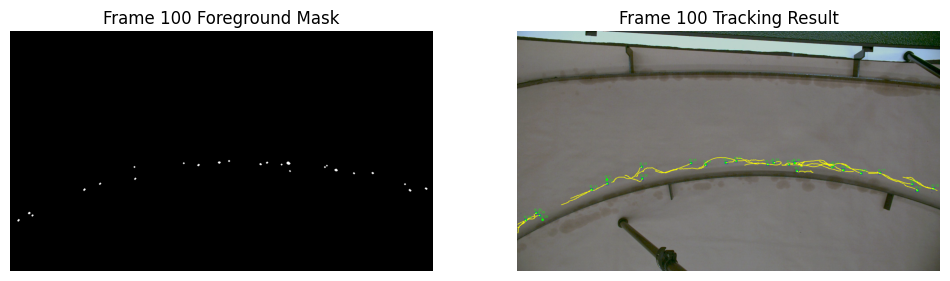

Processed frame 200


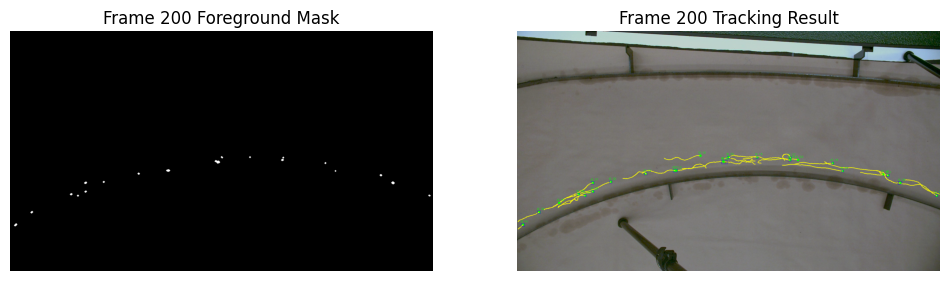

Tracking complete. Total frames processed: 200
Tracking results saved to: /content/drive/MyDrive/arena_project/tracking_runs/run_20250829-131011/tracked_ants_kf_results.csv


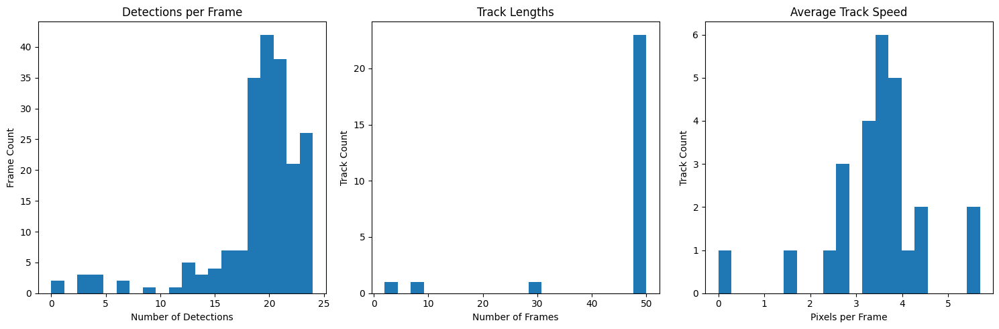

In [13]:
import cv2
import numpy as np
import pandas as pd
from scipy.optimize import linear_sum_assignment
from filterpy.kalman import KalmanFilter
import matplotlib.pyplot as plt
import os
import time

# === User parameters ===
video_path = "/content/drive/MyDrive/arena_project/arena_videos/cropped_video_10.avi"
min_contour_area = 20       # minimum detection area
max_distance = 40           # max assignment distance
max_missing_frames = 30     # max skipped frames before track deletion

# === Output file setup ===
timestamp = time.strftime("%Y%m%d-%H%M%S")
output_dir = f"/content/drive/MyDrive/arena_project/tracking_runs/run_{timestamp}"
os.makedirs(output_dir, exist_ok=True)
video_outfile = os.path.join(output_dir, "tracked_ants_kf.mp4")
csv_outfile = os.path.join(output_dir, "tracked_ants_kf_results.csv")

class Track:
    def __init__(self, track_id, initial_pos):
        self.id = track_id
        self.kf = self.create_kalman_filter(initial_pos)
        self.skipped_frames = 0
        self.trace = [initial_pos]

    def create_kalman_filter(self, pos):
        kf = KalmanFilter(dim_x=4, dim_z=2)
        dt = 1.0
        kf.F = np.array([[1, 0, dt, 0],
                         [0, 1, 0, dt],
                         [0, 0, 1, 0],
                         [0, 0, 0, 1]])
        kf.H = np.array([[1, 0, 0, 0],
                         [0, 1, 0, 0]])
        kf.R *= 0.1
        kf.P *= 10
        kf.Q = np.eye(4) * 0.01
        kf.x[:2] = np.array([[pos[0]], [pos[1]]])
        kf.x[2:] = 0.0
        return kf

    def predict(self):
        self.kf.predict()
        return self.kf.x[:2].reshape(2)

    def update(self, pos):
        self.kf.update(np.array(pos))
        self.trace.append(pos)
        if len(self.trace) > 50:
            self.trace.pop(0)
        self.skipped_frames = 0

    def increment_skipped(self):
        self.skipped_frames += 1

def iou_cost_matrix(tracks, detections):
    cost_matrix = np.zeros((len(tracks), len(detections)), dtype=np.float32)
    for i, track in enumerate(tracks):
        pred_pos = track.predict()
        for j, det in enumerate(detections):
            dist = np.linalg.norm(pred_pos - np.array(det[:2]))
            cost_matrix[i][j] = dist
    return cost_matrix

cap = cv2.VideoCapture(video_path)
fps = cap.get(cv2.CAP_PROP_FPS)
frame_width  = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fourcc = cv2.VideoWriter_fourcc(*"mp4v")
out = cv2.VideoWriter(video_outfile, fourcc, fps, (frame_width, frame_height))
bg_subtractor = cv2.createBackgroundSubtractorMOG2(history=100, varThreshold=40, detectShadows=False)

tracks = []
next_id = 0
results = []
detection_counts = []

frame_count = 0

while True:
    ret, frame = cap.read()
    if not ret:
        break
    frame_count += 1

    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    fg_mask = bg_subtractor.apply(gray)

    # Clean mask to reduce noise
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
    fg_mask = cv2.morphologyEx(fg_mask, cv2.MORPH_OPEN, kernel, iterations=2)
    fg_mask = cv2.dilate(fg_mask, kernel, iterations=2)

    contours, _ = cv2.findContours(fg_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    detections = []
    for cnt in contours:
        if cv2.contourArea(cnt) >= min_contour_area:
            x, y, w, h = cv2.boundingRect(cnt)
            cx = x + w // 2
            cy = y + h // 2
            detections.append((cx, cy, x, y, w, h))

    detection_counts.append(len(detections))

    # Initialize or update tracks
    if len(tracks) == 0:
        for det in detections:
            trk = Track(next_id, det[:2])
            trk.update(det[:2])
            tracks.append(trk)
            next_id += 1
    else:
        cost_matrix = iou_cost_matrix(tracks, detections)
        if cost_matrix.size > 0:
            row_ind, col_ind = linear_sum_assignment(cost_matrix)
        else:
            row_ind, col_ind = np.array([]), np.array([])

        assigned_tracks = set()
        assigned_detections = set()
        for r, c in zip(row_ind, col_ind):
            if cost_matrix[r, c] < max_distance:
                tracks[r].update(detections[c][:2])
                assigned_tracks.add(r)
                assigned_detections.add(c)
                cx, cy, x, y, w, h = detections[c]
                results.append({'frame': frame_count, 'track_id': tracks[r].id,
                                'x': x, 'y': y, 'w': w, 'h': h, 'cx': cx, 'cy': cy})
        for i, trk in enumerate(tracks):
            if i not in assigned_tracks:
                trk.increment_skipped()
        tracks = [trk for trk in tracks if trk.skipped_frames <= max_missing_frames]
        for i, det in enumerate(detections):
            if i not in assigned_detections:
                trk = Track(next_id, det[:2])
                trk.update(det[:2])
                tracks.append(trk)
                next_id += 1
                cx, cy, x, y, w, h = det
                results.append({'frame': frame_count, 'track_id': trk.id,
                                'x': x, 'y': y, 'w': w, 'h': h, 'cx': cx, 'cy': cy})

    # Draw tracked objects and trajectories
    for trk in tracks:
        pred = trk.predict()
        px, py = int(pred[0]), int(pred[1])
        cv2.circle(frame, (px, py), 6, (0, 255, 0), -1)
        cv2.putText(frame, f"ID {trk.id}", (px - 10, py - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.4, (0, 255, 0), 1)
        for j in range(1, len(trk.trace)):
            pt1 = (int(trk.trace[j - 1][0]), int(trk.trace[j - 1][1]))
            pt2 = (int(trk.trace[j][0]), int(trk.trace[j][1]))
            cv2.line(frame, pt1, pt2, (0, 255, 255), 2)
    for det in detections:
        cx, cy, x, y, w, h = det
        cv2.rectangle(frame, (x, y), (x + w, y + h), (255, 0, 0), 1)

    out.write(frame)

    # Diagnostic output every 100 frames
    if frame_count % 100 == 0:
        print(f"Processed frame {frame_count}")
        plt.figure(figsize=(12, 5))
        plt.subplot(1, 2, 1)
        plt.title(f"Frame {frame_count} Foreground Mask")
        plt.imshow(fg_mask, cmap='gray')
        plt.axis('off')
        plt.subplot(1, 2, 2)
        plt.title(f"Frame {frame_count} Tracking Result")
        plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.show()

cap.release()
out.release()

print(f"Tracking complete. Total frames processed: {frame_count}")

# Save tracking results CSV
df = pd.DataFrame(results)
df.to_csv(csv_outfile, index=False)
print(f"Tracking results saved to: {csv_outfile}")

# Histogram of detections per frame and track lengths
track_lengths = [len(trk.trace) for trk in tracks]
avg_speeds = []
for trk in tracks:
    if len(trk.trace) > 1:
        dists = [np.linalg.norm(np.array(trk.trace[i]) - np.array(trk.trace[i-1])) for i in range(1, len(trk.trace))]
        avg_speeds.append(np.mean(dists))

plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.hist(detection_counts, bins=20)
plt.title('Detections per Frame')
plt.xlabel('Number of Detections')
plt.ylabel('Frame Count')

plt.subplot(1, 3, 2)
plt.hist(track_lengths, bins=20)
plt.title('Track Lengths')
plt.xlabel('Number of Frames')
plt.ylabel('Track Count')

plt.subplot(1, 3, 3)
plt.hist(avg_speeds, bins=20)
plt.title('Average Track Speed')
plt.xlabel('Pixels per Frame')
plt.ylabel('Track Count')

plt.tight_layout()
plt.show()


Track 0 length: 2, avg speed: 0.00
Track 1 length: 2, avg speed: 0.00
Track 2 length: 2, avg speed: 0.00
Track 3 length: 2, avg speed: 0.00
Track 4 length: 2, avg speed: 0.00
Track 5 length: 2, avg speed: 0.00
Track 6 length: 2, avg speed: 0.00
Track 7 length: 2, avg speed: 0.00
Track 8 length: 2, avg speed: 0.00
Track 9 length: 2, avg speed: 0.00
Track 10 length: 2, avg speed: 0.00
Track 11 length: 2, avg speed: 0.00
Track 12 length: 2, avg speed: 0.00
Track 13 length: 2, avg speed: 0.00
Track 14 length: 2, avg speed: 0.00
Track 15 length: 2, avg speed: 0.00
Track 16 length: 2, avg speed: 0.00
Track 17 length: 2, avg speed: 0.00
Track 18 length: 2, avg speed: 0.00
Track 19 length: 2, avg speed: 0.00
Track 20 length: 2, avg speed: 0.00
Track 21 length: 2, avg speed: 0.00
Track 22 length: 2, avg speed: 0.00
Track 23 length: 2, avg speed: 0.00
Track 24 length: 2, avg speed: 0.00
Track 25 length: 2, avg speed: 0.00
Track 26 length: 2, avg speed: 0.00
Track 27 length: 2, avg speed: 0.00
Tr

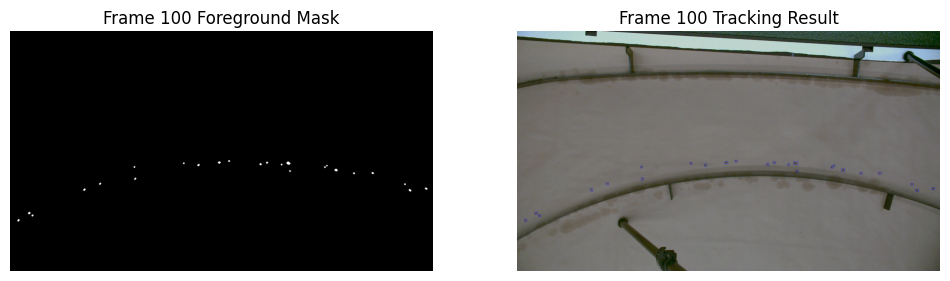

Track 1685 length: 2, avg speed: 0.00
Track 1686 length: 2, avg speed: 0.00
Track 1687 length: 2, avg speed: 0.00
Track 1688 length: 2, avg speed: 0.00
Track 1689 length: 2, avg speed: 0.00
Track 1690 length: 2, avg speed: 0.00
Track 1691 length: 2, avg speed: 0.00
Track 1692 length: 2, avg speed: 0.00
Track 1693 length: 2, avg speed: 0.00
Track 1694 length: 2, avg speed: 0.00
Track 1695 length: 2, avg speed: 0.00
Track 1696 length: 2, avg speed: 0.00
Track 1697 length: 2, avg speed: 0.00
Track 1698 length: 2, avg speed: 0.00
Track 1699 length: 2, avg speed: 0.00
Track 1700 length: 2, avg speed: 0.00
Track 1701 length: 2, avg speed: 0.00
Track 1702 length: 2, avg speed: 0.00
Track 1703 length: 2, avg speed: 0.00
Track 1704 length: 2, avg speed: 0.00
Track 1705 length: 2, avg speed: 0.00
Track 1706 length: 2, avg speed: 0.00
Track 1707 length: 2, avg speed: 0.00
Track 1708 length: 2, avg speed: 0.00
Track 1709 length: 2, avg speed: 0.00
Track 1710 length: 2, avg speed: 0.00
Track 1711 l

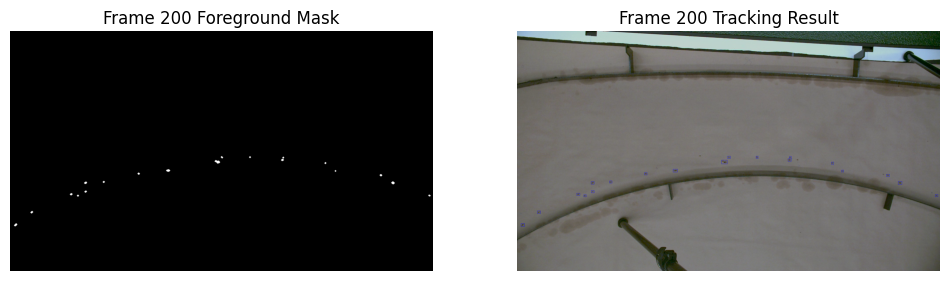

Tracking complete. Total frames processed: 200
Tracking results saved to: /content/drive/MyDrive/arena_project/tracking_runs/run_20250829-131541/tracked_ants_kf_results.csv


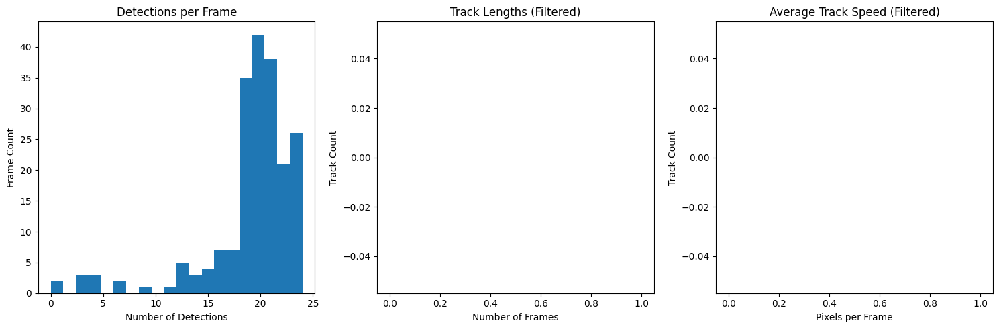

In [16]:
import cv2
import numpy as np
import pandas as pd
from scipy.optimize import linear_sum_assignment
from filterpy.kalman import KalmanFilter
import matplotlib.pyplot as plt
import os
import time

# === User parameters ===
video_path = "/content/drive/MyDrive/arena_project/arena_videos/cropped_video_10.avi"
min_contour_area = 20       # minimum detection area
max_distance = 40           # max assignment distance
max_missing_frames = 45     # max skipped frames before track deletion

# === Output file setup ===
timestamp = time.strftime("%Y%m%d-%H%M%S")
output_dir = f"/content/drive/MyDrive/arena_project/tracking_runs/run_{timestamp}"
os.makedirs(output_dir, exist_ok=True)
video_outfile = os.path.join(output_dir, "tracked_ants_kf.mp4")
csv_outfile = os.path.join(output_dir, "tracked_ants_kf_results.csv")

class Track:
    def __init__(self, track_id, initial_pos):
        self.id = track_id
        self.kf = self.create_kalman_filter(initial_pos)
        self.skipped_frames = 0
        self.trace = [initial_pos]

    def create_kalman_filter(self, pos):
        kf = KalmanFilter(dim_x=4, dim_z=2)
        dt = 1.0
        kf.F = np.array([[1, 0, dt, 0],
                         [0, 1, 0, dt],
                         [0, 0, 1, 0],
                         [0, 0, 0, 1]])
        kf.H = np.array([[1, 0, 0, 0],
                         [0, 1, 0, 0]])
        kf.R *= 0.1
        kf.P *= 10
        kf.Q = np.eye(4) * 0.01
        kf.x[:2] = np.array([[pos[0]], [pos[1]]])
        kf.x[2:] = 0.0
        return kf

    def predict(self):
        self.kf.predict()
        return self.kf.x[:2].reshape(2)

    def update(self, pos):
        self.kf.update(np.array(pos))
        self.trace.append(pos)
        if len(self.trace) > 50:
            self.trace.pop(0)
        self.skipped_frames = 0

    def increment_skipped(self):
        self.skipped_frames += 1

    def track_length(self):
        return len(self.trace)

    def compute_avg_speed(self):
        # Average speed in pixels/frame over track
        if self.track_length() > 1:
            dists = [np.linalg.norm(np.array(self.trace[i]) - np.array(self.trace[i-1]))
                     for i in range(1, len(self.trace))]
            return np.mean(dists)
        else:
            return 0.0

def iou_cost_matrix(tracks, detections):
    cost_matrix = np.zeros((len(tracks), len(detections)), dtype=np.float32)
    for i, track in enumerate(tracks):
        pred_pos = track.predict()
        for j, det in enumerate(detections):
            dist = np.linalg.norm(pred_pos - np.array(det[:2]))
            cost_matrix[i][j] = dist
    return cost_matrix

cap = cv2.VideoCapture(video_path)
fps = cap.get(cv2.CAP_PROP_FPS)
frame_width  = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fourcc = cv2.VideoWriter_fourcc(*"mp4v")
out = cv2.VideoWriter(video_outfile, fourcc, fps, (frame_width, frame_height))
bg_subtractor = cv2.createBackgroundSubtractorMOG2(history=100, varThreshold=40, detectShadows=False)

tracks = []
next_id = 0
results = []
detection_counts = []

frame_count = 0

while True:
    ret, frame = cap.read()
    if not ret:
        break
    frame_count += 1

    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    fg_mask = bg_subtractor.apply(gray)

    # Clean mask to reduce noise
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
    fg_mask = cv2.morphologyEx(fg_mask, cv2.MORPH_OPEN, kernel, iterations=2)
    fg_mask = cv2.dilate(fg_mask, kernel, iterations=2)

    contours, _ = cv2.findContours(fg_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    detections = []
    for cnt in contours:
        if cv2.contourArea(cnt) >= min_contour_area:
            x, y, w, h = cv2.boundingRect(cnt)
            cx = x + w // 2
            cy = y + h // 2
            detections.append((cx, cy, x, y, w, h))

    detection_counts.append(len(detections))

    # Initialize or update tracks
    if len(tracks) == 0:
        for det in detections:
            trk = Track(next_id, det[:2])
            trk.update(det[:2])
            tracks.append(trk)
            next_id += 1
    else:
        cost_matrix = iou_cost_matrix(tracks, detections)
        if cost_matrix.size > 0:
            row_ind, col_ind = linear_sum_assignment(cost_matrix)
        else:
            row_ind, col_ind = np.array([]), np.array([])

        assigned_tracks = set()
        assigned_detections = set()
        for r, c in zip(row_ind, col_ind):
            if cost_matrix[r, c] < max_distance:
                tracks[r].update(detections[c][:2])
                assigned_tracks.add(r)
                assigned_detections.add(c)
                cx, cy, x, y, w, h = detections[c]
                results.append({'frame': frame_count, 'track_id': tracks[r].id,
                                'x': x, 'y': y, 'w': w, 'h': h, 'cx': cx, 'cy': cy})
        for i, trk in enumerate(tracks):
            if i not in assigned_tracks:
                trk.increment_skipped()
        tracks = [trk for trk in tracks if trk.skipped_frames <= max_missing_frames]
        for i, det in enumerate(detections):
            if i not in assigned_detections:
                trk = Track(next_id, det[:2])
                trk.update(det[:2])
                tracks.append(trk)
                next_id += 1
                cx, cy, x, y, w, h = det
                results.append({'frame': frame_count, 'track_id': trk.id,
                                'x': x, 'y': y, 'w': w, 'h': h, 'cx': cx, 'cy': cy})

    # Filter tracks based on length and average speed with diagnostic printing
    filtered_tracks = []
    for trk in tracks:
        length = trk.track_length()
        avg_speed = trk.compute_avg_speed()
        print(f"Track {trk.id} length: {length}, avg speed: {avg_speed:.2f}")
        if length >= 10 and avg_speed <= 30:
            filtered_tracks.append(trk)
    tracks = filtered_tracks


    # Draw tracked objects and trajectories
    for trk in tracks:
        pred = trk.predict()
        px, py = int(pred[0]), int(pred[1])
        cv2.circle(frame, (px, py), 6, (0, 255, 0), -1)
        cv2.putText(frame, f"ID {trk.id}", (px - 10, py - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.4, (0, 255, 0), 1)
        for j in range(1, len(trk.trace)):
            pt1 = (int(trk.trace[j - 1][0]), int(trk.trace[j - 1][1]))
            pt2 = (int(trk.trace[j][0]), int(trk.trace[j][1]))
            cv2.line(frame, pt1, pt2, (0, 255, 255), 2)
    for det in detections:
        cx, cy, x, y, w, h = det
        cv2.rectangle(frame, (x, y), (x + w, y + h), (255, 0, 0), 1)

    out.write(frame)

    if frame_count % 100 == 0:
        print(f"Processed frame {frame_count}")
        plt.figure(figsize=(12, 5))
        plt.subplot(1, 2, 1)
        plt.title(f"Frame {frame_count} Foreground Mask")
        plt.imshow(fg_mask, cmap='gray')
        plt.axis('off')
        plt.subplot(1, 2, 2)
        plt.title(f"Frame {frame_count} Tracking Result")
        plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.show()

cap.release()
out.release()

print(f"Tracking complete. Total frames processed: {frame_count}")

# Save tracking results CSV
df = pd.DataFrame(results)
df.to_csv(csv_outfile, index=False)
print(f"Tracking results saved to: {csv_outfile}")

# Histogram of detections per frame and track lengths
track_lengths = [len(trk.trace) for trk in tracks]
avg_speeds = []
for trk in tracks:
    if len(trk.trace) > 1:
        dists = [np.linalg.norm(np.array(trk.trace[i]) - np.array(trk.trace[i-1])) for i in range(1, len(trk.trace))]
        avg_speeds.append(np.mean(dists))

plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.hist(detection_counts, bins=20)
plt.title('Detections per Frame')
plt.xlabel('Number of Detections')
plt.ylabel('Frame Count')

plt.subplot(1, 3, 2)
plt.hist(track_lengths, bins=20)
plt.title('Track Lengths (Filtered)')
plt.xlabel('Number of Frames')
plt.ylabel('Track Count')

plt.subplot(1, 3, 3)
plt.hist(avg_speeds, bins=20)
plt.title('Average Track Speed (Filtered)')
plt.xlabel('Pixels per Frame')
plt.ylabel('Track Count')

plt.tight_layout()
plt.show()

Processed frame 100


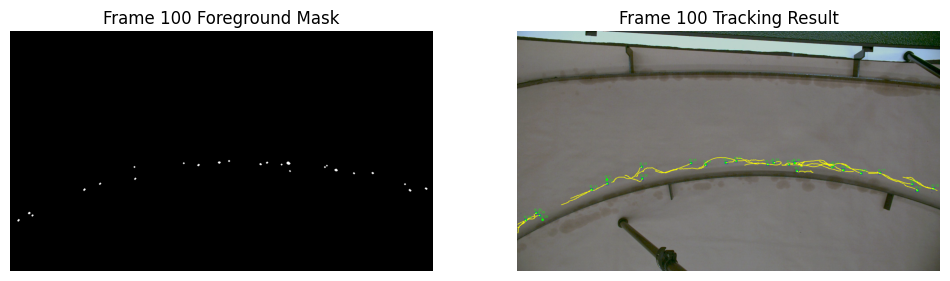

Processed frame 200


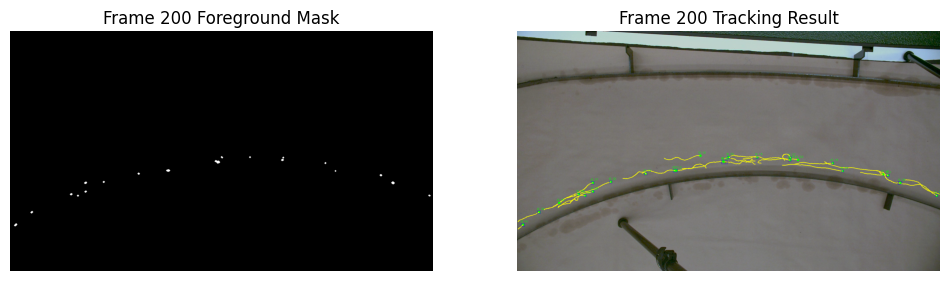

Processed frame 300


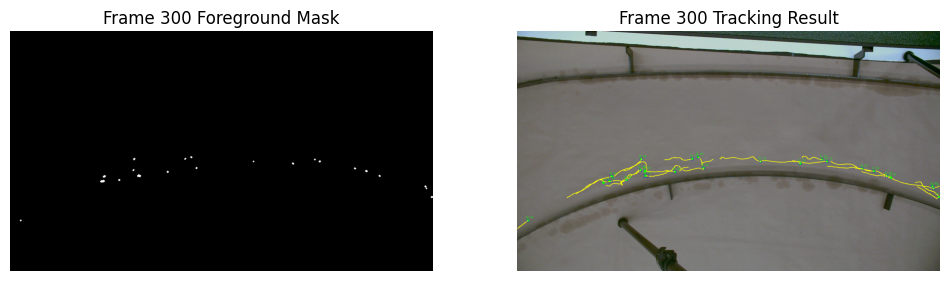

Processed frame 400


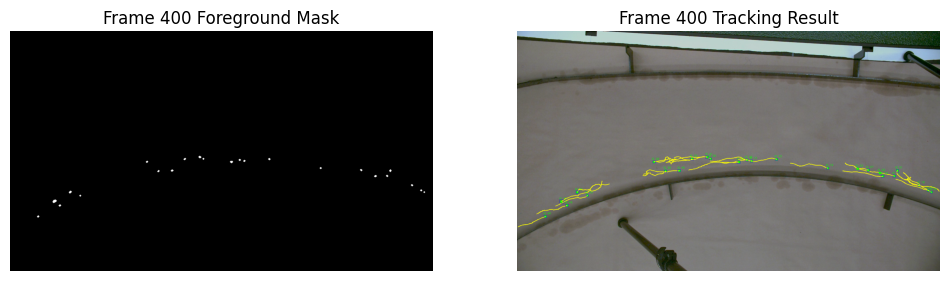

Processed frame 500


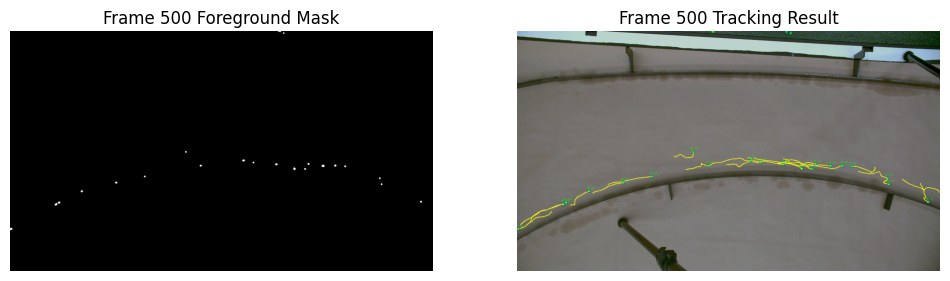

Processed frame 600


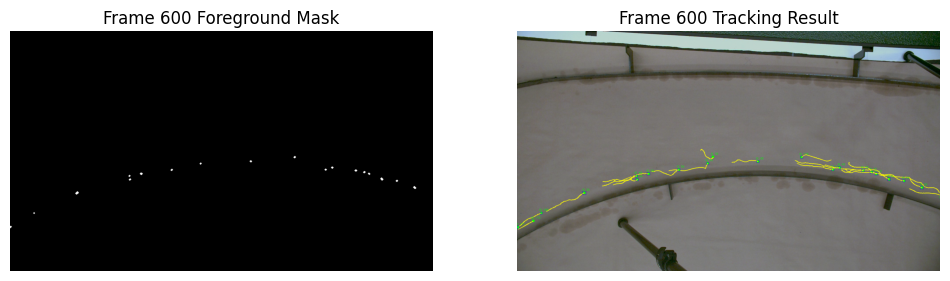

Processed frame 700


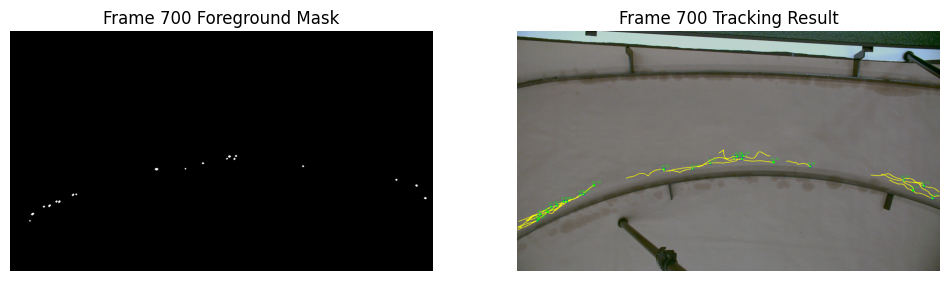

Processed frame 800


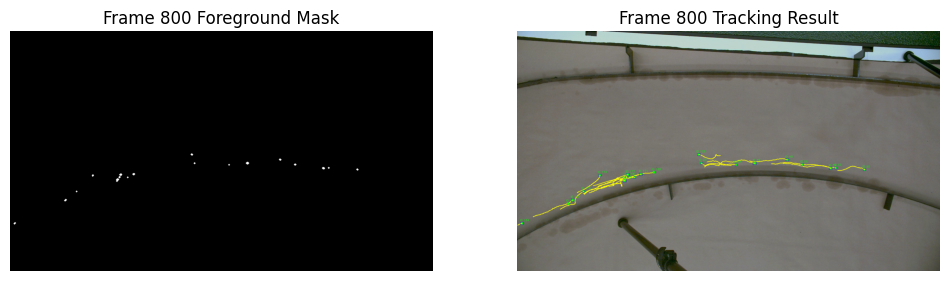

Processed frame 900


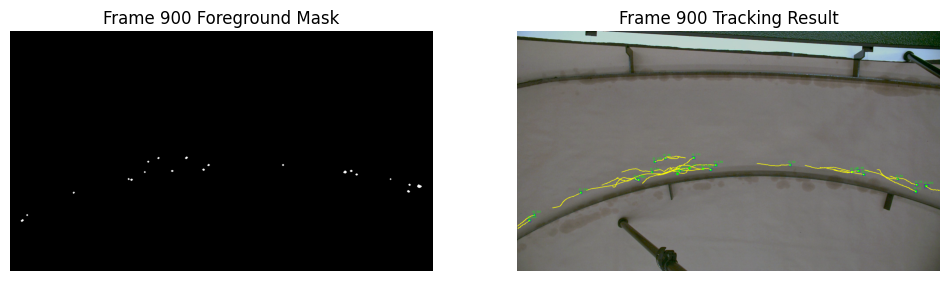

Processed frame 1000


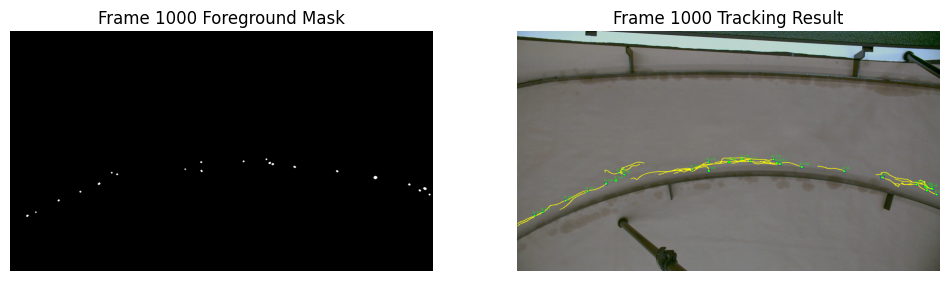

Processed frame 1100


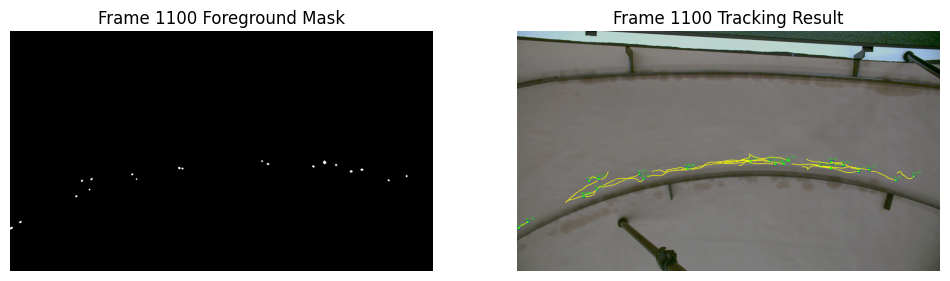

Processed frame 1200


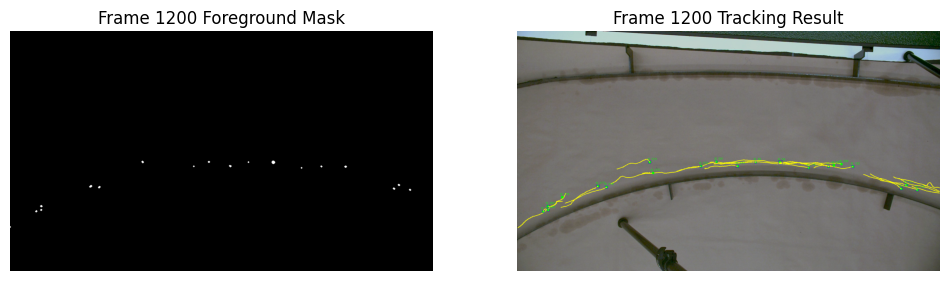

Tracking complete. Total frames processed: 1200
Number of filtered tracks: 21
Tracking results saved to: /content/drive/MyDrive/arena_project/tracking_runs/run_20250829-141120/tracked_ants_kf_results.csv


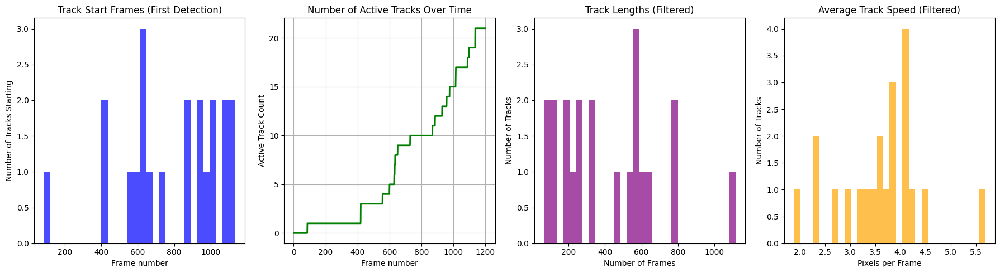

In [26]:
import cv2
import numpy as np
import pandas as pd
from scipy.optimize import linear_sum_assignment
from filterpy.kalman import KalmanFilter
import matplotlib.pyplot as plt
import os
import time

# === User parameters ===
video_path = "/content/drive/MyDrive/arena_project/arena_videos/cropped_video.avi"
min_contour_area = 20       # minimum detection area
max_distance = 40           # max assignment distance (pixels)
max_missing_frames = 30     # max skipped frames before track deletion

# === Output file setup ===
timestamp = time.strftime("%Y%m%d-%H%M%S")
output_dir = f"/content/drive/MyDrive/arena_project/tracking_runs/run_{timestamp}"
os.makedirs(output_dir, exist_ok=True)
video_outfile = os.path.join(output_dir, "tracked_ants_kf.mp4")
csv_outfile = os.path.join(output_dir, "tracked_ants_kf_results.csv")

class Track:
    def __init__(self, track_id, initial_pos, start_frame):
        self.id = track_id
        self.kf = self.create_kalman_filter(initial_pos)
        self.skipped_frames = 0
        self.trace = [initial_pos]
        self.start_frame = start_frame  # frame number when the track started

    def create_kalman_filter(self, pos):
        kf = KalmanFilter(dim_x=4, dim_z=2)
        dt = 1.0
        kf.F = np.array([[1, 0, dt, 0],
                         [0, 1, 0, dt],
                         [0, 0, 1, 0],
                         [0, 0, 0, 1]])
        kf.H = np.array([[1, 0, 0, 0],
                         [0, 1, 0, 0]])
        kf.R *= 0.1
        kf.P *= 10
        kf.Q = np.eye(4) * 0.01
        kf.x[:2] = np.array([[pos[0]], [pos[1]]])
        kf.x[2:] = 0.0
        return kf

    def predict(self):
        self.kf.predict()
        return self.kf.x[:2].reshape(2)

    def update(self, pos):
        self.kf.update(np.array(pos))
        self.trace.append(pos)
        if len(self.trace) > 50:
            self.trace.pop(0)
        self.skipped_frames = 0

    def increment_skipped(self):
        self.skipped_frames += 1

    def track_length(self, current_frame):
        # track_length returns how long the track has existed up to current frame, inclusive
        return current_frame - self.start_frame + 1

    def compute_avg_speed(self):
        if len(self.trace) > 1:
            dists = [np.linalg.norm(np.array(self.trace[i]) - np.array(self.trace[i-1])) for i in range(1, len(self.trace))]
            return np.mean(dists)
        else:
            return 0.0

def iou_cost_matrix(tracks, detections):
    cost_matrix = np.zeros((len(tracks), len(detections)), dtype=np.float32)
    for i, track in enumerate(tracks):
        pred_pos = track.predict()
        for j, det in enumerate(detections):
            dist = np.linalg.norm(pred_pos - np.array(det[:2]))
            cost_matrix[i][j] = dist
    return cost_matrix

cap = cv2.VideoCapture(video_path)
fps = cap.get(cv2.CAP_PROP_FPS)
frame_width  = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fourcc = cv2.VideoWriter_fourcc(*"mp4v")
out = cv2.VideoWriter(video_outfile, fourcc, fps, (frame_width, frame_height))
bg_subtractor = cv2.createBackgroundSubtractorMOG2(history=100, varThreshold=40, detectShadows=False)

tracks = []
next_id = 0
results = []
detection_counts = []

frame_count = 0

while True:
    ret, frame = cap.read()
    if not ret:
        break
    frame_count += 1

    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    fg_mask = bg_subtractor.apply(gray)

    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
    fg_mask = cv2.morphologyEx(fg_mask, cv2.MORPH_OPEN, kernel, iterations=2)
    fg_mask = cv2.dilate(fg_mask, kernel, iterations=2)

    contours, _ = cv2.findContours(fg_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    detections = []
    for cnt in contours:
        if cv2.contourArea(cnt) >= min_contour_area:
            x, y, w, h = cv2.boundingRect(cnt)
            cx = x + w // 2
            cy = y + h // 2
            detections.append((cx, cy, x, y, w, h))

    detection_counts.append(len(detections))

    if len(tracks) == 0:
        for det in detections:
            trk = Track(next_id, det[:2], frame_count)
            trk.update(det[:2])
            tracks.append(trk)
            next_id += 1
    else:
        cost_matrix = iou_cost_matrix(tracks, detections)
        if cost_matrix.size > 0:
            row_ind, col_ind = linear_sum_assignment(cost_matrix)
        else:
            row_ind, col_ind = np.array([]), np.array([])

        assigned_tracks = set()
        assigned_detections = set()
        for r, c in zip(row_ind, col_ind):
            if cost_matrix[r, c] < max_distance:
                tracks[r].update(detections[c][:2])
                assigned_tracks.add(r)
                assigned_detections.add(c)
                cx, cy, x, y, w, h = detections[c]
                results.append({'frame': frame_count, 'track_id': tracks[r].id,
                                'x': x, 'y': y, 'w': w, 'h': h, 'cx': cx, 'cy': cy})
        for i, trk in enumerate(tracks):
            if i not in assigned_tracks:
                trk.increment_skipped()
        tracks = [trk for trk in tracks if trk.skipped_frames <= max_missing_frames]
        for i, det in enumerate(detections):
            if i not in assigned_detections:
                trk = Track(next_id, det[:2], frame_count)
                trk.update(det[:2])
                tracks.append(trk)
                next_id += 1
                cx, cy, x, y, w, h = det
                results.append({'frame': frame_count, 'track_id': trk.id,
                                'x': x, 'y': y, 'w': w, 'h': h, 'cx': cx, 'cy': cy})

    # Draw tracked objects and trajectories
    for trk in tracks:
        pred = trk.predict()
        px, py = int(pred[0]), int(pred[1])
        cv2.circle(frame, (px, py), 6, (0, 255, 0), -1)
        cv2.putText(frame, f"ID {trk.id}", (px - 10, py - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.4, (0, 255, 0), 1)
        for j in range(1, len(trk.trace)):
            pt1 = (int(trk.trace[j - 1][0]), int(trk.trace[j - 1][1]))
            pt2 = (int(trk.trace[j][0]), int(trk.trace[j][1]))
            cv2.line(frame, pt1, pt2, (0, 255, 255), 2)
    for det in detections:
        cx, cy, x, y, w, h = det
        cv2.rectangle(frame, (x, y), (x + w, y + h), (255, 0, 0), 1)

    out.write(frame)

    if frame_count % 100 == 0:
        print(f"Processed frame {frame_count}")
        plt.figure(figsize=(12, 5))
        plt.subplot(1, 2, 1)
        plt.title(f"Frame {frame_count} Foreground Mask")
        plt.imshow(fg_mask, cmap='gray')
        plt.axis('off')
        plt.subplot(1, 2, 2)
        plt.title(f"Frame {frame_count} Tracking Result")
        plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.show()

cap.release()
out.release()

print(f"Tracking complete. Total frames processed: {frame_count}")

# Filter tracks by length and average speed for analysis and plotting
filtered_tracks = []
for trk in tracks:
    length = trk.track_length(frame_count)
    avg_speed = trk.compute_avg_speed()
    if length >= 50 and avg_speed <= 8:
        filtered_tracks.append(trk)

print(f"Number of filtered tracks: {len(filtered_tracks)}")

df = pd.DataFrame(results)
df.to_csv(csv_outfile, index=False)
print(f"Tracking results saved to: {csv_outfile}")

# Prepare data for plotting
start_frames = [trk.start_frame for trk in filtered_tracks]
track_lengths = [trk.track_length(frame_count) for trk in filtered_tracks]
avg_speeds = [trk.compute_avg_speed() for trk in filtered_tracks]

frame_nums = np.arange(1, frame_count + 1)
cumulative_tracks_counts = np.zeros(frame_count, dtype=int)

# Accumulate number of tracks detected up to each frame
for trk in filtered_tracks:
    start = trk.start_frame - 1  # zero-based index
    length = trk.track_length(frame_count)
    end = min(start + length, frame_count)
    cumulative_tracks_counts[start:end] += 1

plt.figure(figsize=(18, 5))

plt.subplot(1, 4, 1)
plt.hist(start_frames, bins=30, color='blue', alpha=0.7)
plt.title('Track Start Frames (First Detection)')
plt.xlabel('Frame number')
plt.ylabel('Number of Tracks Starting')

plt.subplot(1, 4, 2)
plt.plot(frame_nums, cumulative_tracks_counts, color='green', linewidth=2)
plt.title('Number of Active Tracks Over Time')
plt.xlabel('Frame number')
plt.ylabel('Active Track Count')
plt.grid(True)

plt.subplot(1, 4, 3)
plt.hist(track_lengths, bins=30, color='purple', alpha=0.7)
plt.title('Track Lengths (Filtered)')
plt.xlabel('Number of Frames')
plt.ylabel('Number of Tracks')

plt.subplot(1, 4, 4)
plt.hist(avg_speeds, bins=30, color='orange', alpha=0.7)
plt.title('Average Track Speed (Filtered)')
plt.xlabel('Pixels per Frame')
plt.ylabel('Number of Tracks')

plt.tight_layout()
plt.show()


Processed frame 100


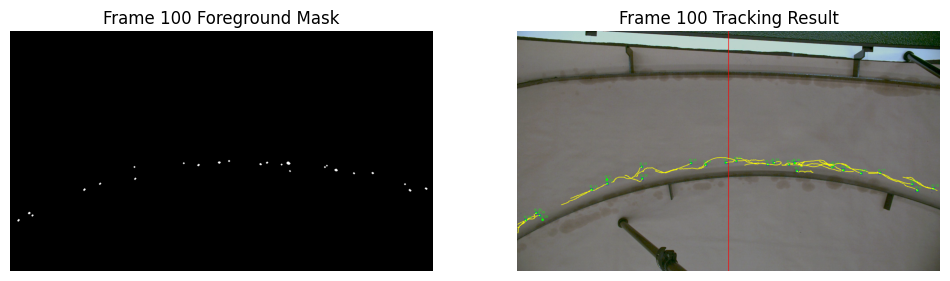

Processed frame 200


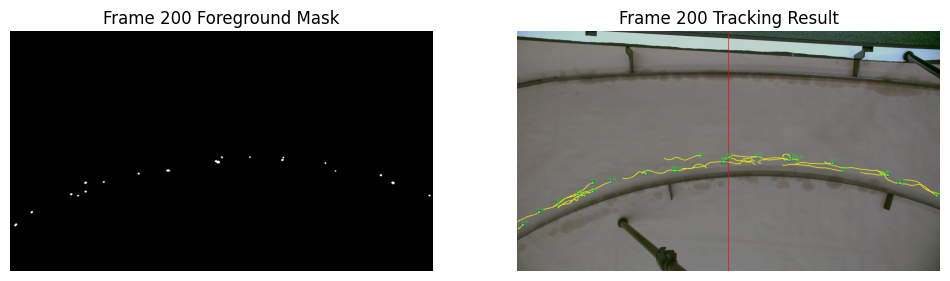

Tracking complete. Total frames processed: 200
Number of filtered tracks: 0
Tracking results saved to: /content/drive/MyDrive/arena_project/tracking_runs/run_20250829-143252/tracked_ants_kf_results.csv


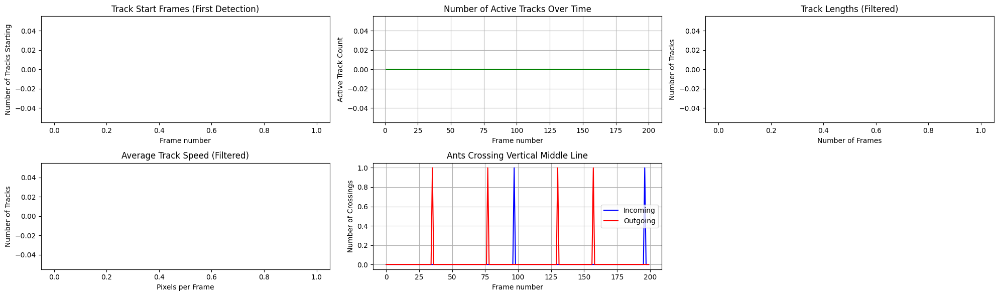

In [29]:
import cv2
import numpy as np
import pandas as pd
from scipy.optimize import linear_sum_assignment
from filterpy.kalman import KalmanFilter
import matplotlib.pyplot as plt
import os
import time

# === User parameters ===
video_path = "/content/drive/MyDrive/arena_project/arena_videos/cropped_video_10.avi"
min_contour_area = 20     # minimum detection area
max_distance = 40         # max assignment distance (pixels)
max_missing_frames = 30   # max skipped frames before track deletion

timestamp = time.strftime("%Y%m%d-%H%M%S")
output_dir = f"/content/drive/MyDrive/arena_project/tracking_runs/run_{timestamp}"
os.makedirs(output_dir, exist_ok=True)
video_outfile = os.path.join(output_dir, "tracked_ants_kf.mp4")
csv_outfile = os.path.join(output_dir, "tracked_ants_kf_results.csv")

class Track:
    def __init__(self, track_id, initial_pos, start_frame):
        self.id = track_id
        self.kf = self.create_kalman_filter(initial_pos)
        self.skipped_frames = 0
        self.trace = [initial_pos]
        self.start_frame = start_frame  # frame number when the track started

    def create_kalman_filter(self, pos):
        kf = KalmanFilter(dim_x=4, dim_z=2)
        dt = 1.0
        kf.F = np.array([[1, 0, dt, 0],
                         [0, 1, 0, dt],
                         [0, 0, 1, 0],
                         [0, 0, 0, 1]])
        kf.H = np.array([[1, 0, 0, 0],
                         [0, 1, 0, 0]])
        kf.R *= 0.1
        kf.P *= 10
        kf.Q = np.eye(4) * 0.01
        kf.x[:2] = np.array([[pos[0]], [pos[1]]])
        kf.x[2:] = 0.0
        return kf

    def predict(self):
        self.kf.predict()
        return self.kf.x[:2].reshape(2)

    def update(self, pos):
        self.kf.update(np.array(pos))
        self.trace.append(pos)
        if len(self.trace) > 50:
            self.trace.pop(0)
        self.skipped_frames = 0

    def increment_skipped(self):
        self.skipped_frames += 1

    def track_length(self, current_frame):
        return current_frame - self.start_frame + 1

    def compute_avg_speed(self):
        if len(self.trace) > 1:
            dists = [np.linalg.norm(np.array(self.trace[i]) - np.array(self.trace[i-1]))
                     for i in range(1, len(self.trace))]
            return np.mean(dists)
        else:
            return 0.0

def iou_cost_matrix(tracks, detections):
    cost_matrix = np.zeros((len(tracks), len(detections)), dtype=np.float32)
    for i, track in enumerate(tracks):
        pred_pos = track.predict()
        for j, det in enumerate(detections):
            dist = np.linalg.norm(pred_pos - np.array(det[:2]))
            cost_matrix[i][j] = dist
    return cost_matrix

# Open video and output
cap = cv2.VideoCapture(video_path)
fps = cap.get(cv2.CAP_PROP_FPS)
frame_width  = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fourcc = cv2.VideoWriter_fourcc(*"mp4v")
out = cv2.VideoWriter(video_outfile, fourcc, fps, (frame_width, frame_height))
bg_subtractor = cv2.createBackgroundSubtractorMOG2(history=100, varThreshold=40, detectShadows=False)

tracks = []
next_id = 0
results = []
detection_counts = []

frame_count = 0

x_line = frame_width // 2

# Counters for crossings per frame
incoming_counts = []
outgoing_counts = []

while True:
    ret, frame = cap.read()
    if not ret:
        break
    frame_count += 1

    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    fg_mask = bg_subtractor.apply(gray)

    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
    fg_mask = cv2.morphologyEx(fg_mask, cv2.MORPH_OPEN, kernel, iterations=2)
    fg_mask = cv2.dilate(fg_mask, kernel, iterations=2)

    contours, _ = cv2.findContours(fg_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    detections = []
    for cnt in contours:
        if cv2.contourArea(cnt) >= min_contour_area:
            x, y, w, h = cv2.boundingRect(cnt)
            cx = x + w // 2
            cy = y + h // 2
            detections.append((cx, cy, x, y, w, h))

    detection_counts.append(len(detections))

    if len(tracks) == 0:
        for det in detections:
            trk = Track(next_id, det[:2], frame_count)
            trk.update(det[:2])
            tracks.append(trk)
            next_id += 1
    else:
        cost_matrix = iou_cost_matrix(tracks, detections)
        if cost_matrix.size > 0:
            row_ind, col_ind = linear_sum_assignment(cost_matrix)
        else:
            row_ind, col_ind = np.array([]), np.array([])

        assigned_tracks = set()
        assigned_detections = set()
        for r, c in zip(row_ind, col_ind):
            if cost_matrix[r, c] < max_distance:
                tracks[r].update(detections[c][:2])
                assigned_tracks.add(r)
                assigned_detections.add(c)
                cx, cy, x, y, w, h = detections[c]
                results.append({'frame': frame_count, 'track_id': tracks[r].id,
                                'x': x, 'y': y, 'w': w, 'h': h, 'cx': cx, 'cy': cy})
        for i, trk in enumerate(tracks):
            if i not in assigned_tracks:
                trk.increment_skipped()
        tracks = [trk for trk in tracks if trk.skipped_frames <= max_missing_frames]
        for i, det in enumerate(detections):
            if i not in assigned_detections:
                trk = Track(next_id, det[:2], frame_count)
                trk.update(det[:2])
                tracks.append(trk)
                next_id += 1
                cx, cy, x, y, w, h = det
                results.append({'frame': frame_count, 'track_id': trk.id,
                                'x': x, 'y': y, 'w': w, 'h': h, 'cx': cx, 'cy': cy})

    # Count line crossings
    incoming_this_frame = 0
    outgoing_this_frame = 0
    for trk in tracks:
        if len(trk.trace) >= 2:
            prev_x = trk.trace[-2][0]
            curr_x = trk.trace[-1][0]
            if prev_x < x_line and curr_x >= x_line:
                outgoing_this_frame += 1
            elif prev_x >= x_line and curr_x < x_line:
                incoming_this_frame += 1
    incoming_counts.append(incoming_this_frame)
    outgoing_counts.append(outgoing_this_frame)

    # Draw vertical line for reference
    cv2.line(frame, (x_line, 0), (x_line, frame_height), (0, 0, 255), 2)

    # Draw tracked objects and trajectories
    for trk in tracks:
        pred = trk.predict()
        px, py = int(pred[0]), int(pred[1])
        cv2.circle(frame, (px, py), 6, (0, 255, 0), -1)
        cv2.putText(frame, f"ID {trk.id}", (px - 10, py - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.4, (0, 255, 0), 1)
        for j in range(1, len(trk.trace)):
            pt1 = (int(trk.trace[j - 1][0]), int(trk.trace[j - 1][1]))
            pt2 = (int(trk.trace[j][0]), int(trk.trace[j][1]))
            cv2.line(frame, pt1, pt2, (0, 255, 255), 2)
    for det in detections:
        cx, cy, x, y, w, h = det
        cv2.rectangle(frame, (x, y), (x + w, y + h), (255, 0, 0), 1)

    out.write(frame)

    if frame_count % 100 == 0:
        print(f"Processed frame {frame_count}")
        plt.figure(figsize=(12, 5))
        plt.subplot(1, 2, 1)
        plt.title(f"Frame {frame_count} Foreground Mask")
        plt.imshow(fg_mask, cmap='gray')
        plt.axis('off')
        plt.subplot(1, 2, 2)
        plt.title(f"Frame {frame_count} Tracking Result")
        plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.show()

cap.release()
out.release()

print(f"Tracking complete. Total frames processed: {frame_count}")

# Filter tracks by length >= 100 and avg speed <= 8
filtered_tracks = []
for trk in tracks:
    length = trk.track_length(frame_count)
    avg_speed = trk.compute_avg_speed()
    if length >= 200 and avg_speed <= 8:
        filtered_tracks.append(trk)

print(f"Number of filtered tracks: {len(filtered_tracks)}")

df = pd.DataFrame(results)
df.to_csv(csv_outfile, index=False)
print(f"Tracking results saved to: {csv_outfile}")

# Prepare data for plotting
start_frames = [trk.start_frame for trk in filtered_tracks]
track_lengths = [trk.track_length(frame_count) for trk in filtered_tracks]
avg_speeds = [trk.compute_avg_speed() for trk in filtered_tracks]

frame_nums = np.arange(1, frame_count + 1)
cumulative_tracks_counts = np.zeros(frame_count, dtype=int)

# Accumulate total number of tracks active at each frame
for trk in filtered_tracks:
    start = trk.start_frame - 1
    length = trk.track_length(frame_count)
    end = min(start + length, frame_count)
    cumulative_tracks_counts[start:end] += 1

plt.figure(figsize=(20, 6))

plt.subplot(2, 3, 1)
plt.hist(start_frames, bins=30, color='blue', alpha=0.7)
plt.title('Track Start Frames (First Detection)')
plt.xlabel('Frame number')
plt.ylabel('Number of Tracks Starting')

plt.subplot(2, 3, 2)
plt.plot(frame_nums, cumulative_tracks_counts, color='green', linewidth=2)
plt.title('Number of Active Tracks Over Time')
plt.xlabel('Frame number')
plt.ylabel('Active Track Count')
plt.grid(True)

plt.subplot(2, 3, 3)
plt.hist(track_lengths, bins=30, color='purple', alpha=0.7)
plt.title('Track Lengths (Filtered)')
plt.xlabel('Number of Frames')
plt.ylabel('Number of Tracks')

plt.subplot(2, 3, 4)
plt.hist(avg_speeds, bins=30, color='orange', alpha=0.7)
plt.title('Average Track Speed (Filtered)')
plt.xlabel('Pixels per Frame')
plt.ylabel('Number of Tracks')

plt.subplot(2, 3, 5)
plt.plot(range(len(incoming_counts)), incoming_counts, label='Incoming', color='blue')
plt.plot(range(len(outgoing_counts)), outgoing_counts, label='Outgoing', color='red')
plt.title('Ants Crossing Vertical Middle Line')
plt.xlabel('Frame number')
plt.ylabel('Number of Crossings')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


Processed frame 100


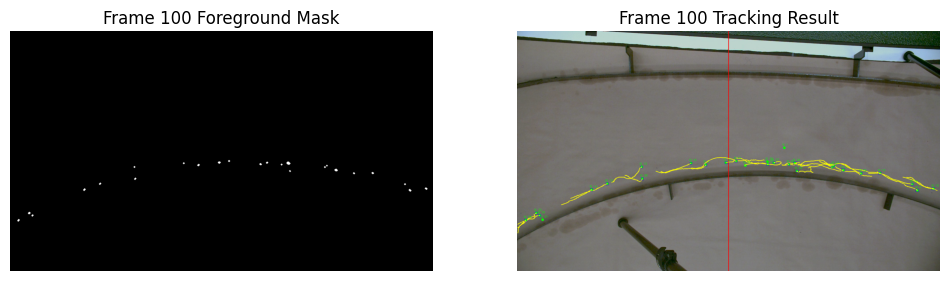

Processed frame 200


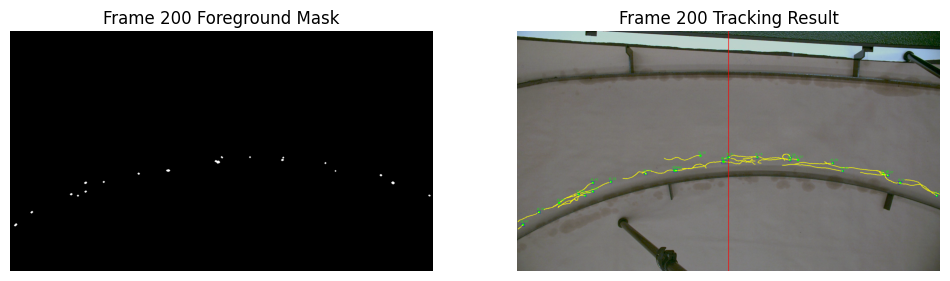

Processed frame 300


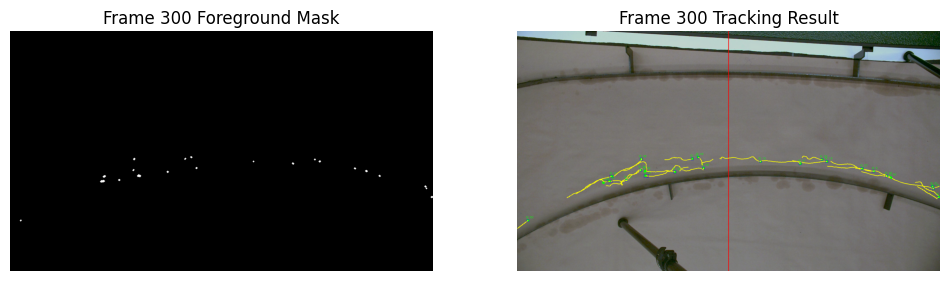

Processed frame 400


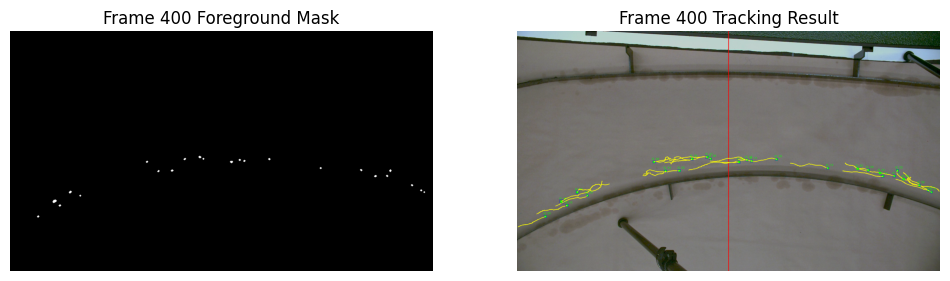

Processed frame 500


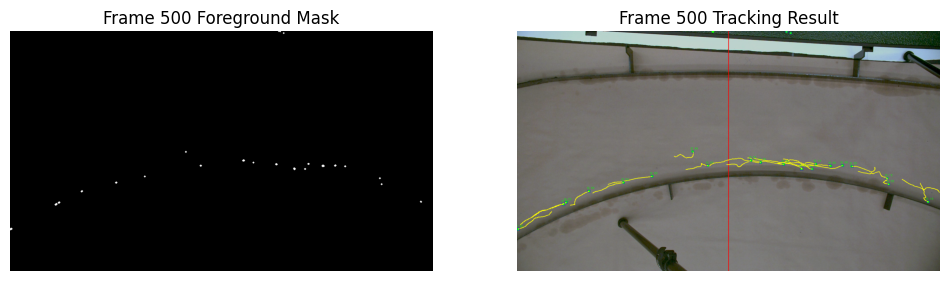

Processed frame 600


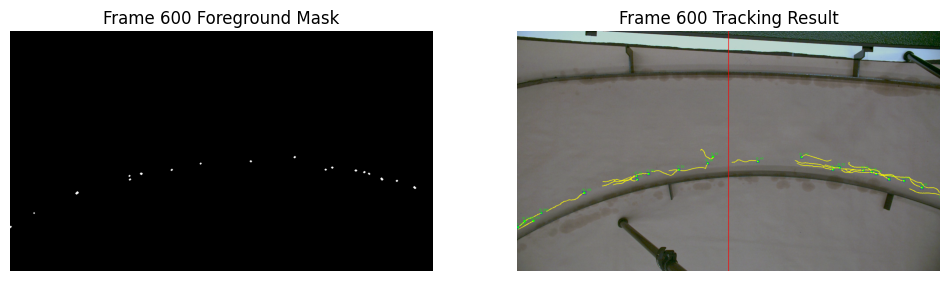

Processed frame 700


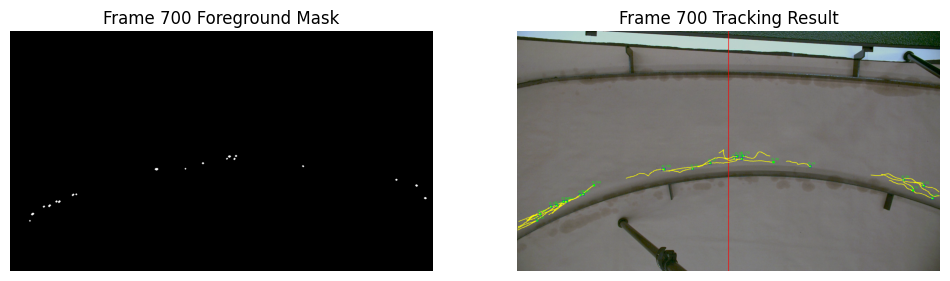

Processed frame 800


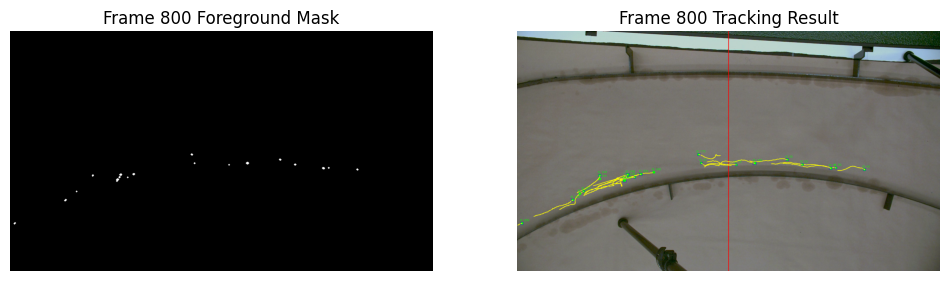

Processed frame 900


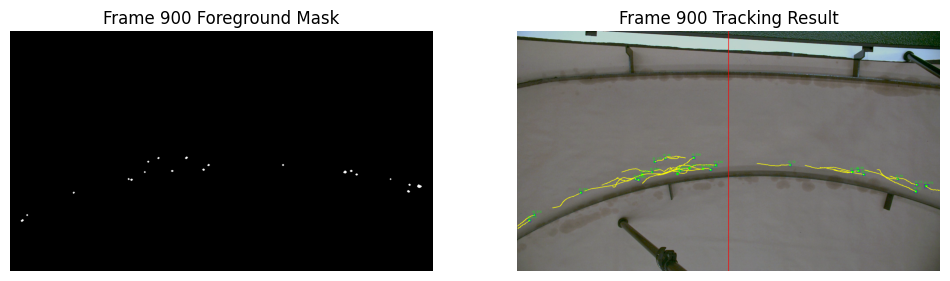

Processed frame 1000


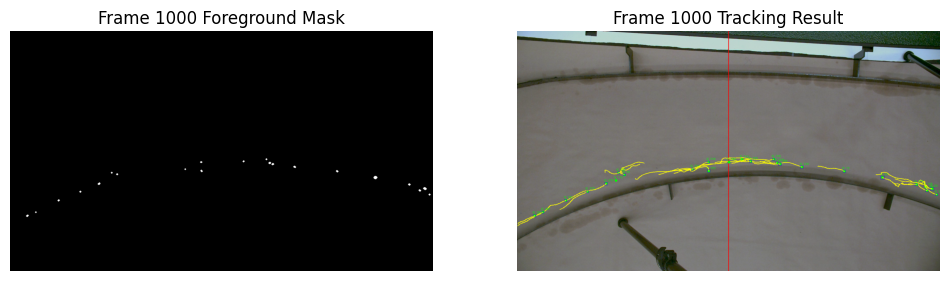

Processed frame 1100


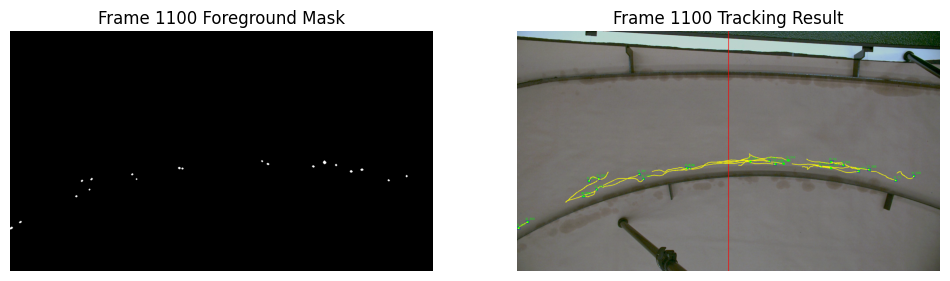

Processed frame 1200


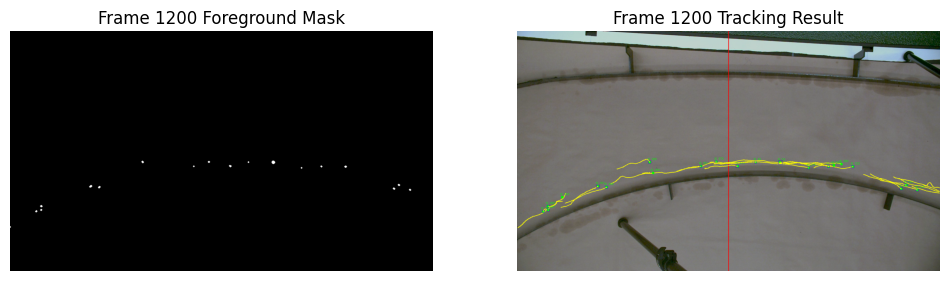

Tracking complete. Total frames processed: 1200
Number of filtered tracks: 19
Tracking results saved to: /content/drive/MyDrive/arena_project/tracking_runs/run_20250829-143853/tracked_ants_kf_results.csv


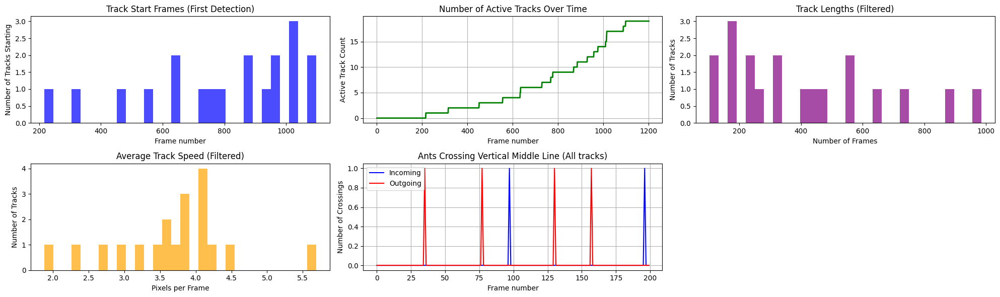


Crossings per 200 frames (filtered tracks only):
   interval_start  interval_end  incoming  outgoing
0               1           200         0         0
1             201           400         0         0
2             401           600         0         0
3             601           800         1         3
4             801          1000         0         4
5            1001          1200         0         5


In [30]:
import cv2
import numpy as np
import pandas as pd
from scipy.optimize import linear_sum_assignment
from filterpy.kalman import KalmanFilter
import matplotlib.pyplot as plt
import os
import time
import math

# === User params ===
video_path = "/content/drive/MyDrive/arena_project/arena_videos/cropped_video.avi"
min_contour_area = 20
max_distance = 20
max_missing_frames = 30

timestamp = time.strftime("%Y%m%d-%H%M%S")
output_dir = f"/content/drive/MyDrive/arena_project/tracking_runs/run_{timestamp}"
os.makedirs(output_dir, exist_ok=True)
video_outfile = os.path.join(output_dir, "tracked_ants_kf.mp4")
csv_outfile = os.path.join(output_dir, "tracked_ants_kf_results.csv")

class Track:
    def __init__(self, track_id, initial_pos, start_frame):
        self.id = track_id
        self.kf = self.create_kalman_filter(initial_pos)
        self.skipped_frames = 0
        self.trace = [initial_pos]
        self.start_frame = start_frame

    def create_kalman_filter(self, pos):
        kf = KalmanFilter(dim_x=4, dim_z=2)
        dt = 1.0
        kf.F = np.array([[1, 0, dt, 0],
                         [0, 1, 0, dt],
                         [0, 0, 1, 0],
                         [0, 0, 0, 1]])
        kf.H = np.array([[1, 0, 0, 0],
                         [0, 1, 0, 0]])
        kf.R *= 0.1
        kf.P *= 10
        kf.Q = np.eye(4) * 0.01
        kf.x[:2] = np.array([[pos[0]], [pos[1]]])
        kf.x[2:] = 0.0
        return kf

    def predict(self):
        self.kf.predict()
        return self.kf.x[:2].reshape(2)

    def update(self, pos):
        self.kf.update(np.array(pos))
        self.trace.append(pos)
        if len(self.trace) > 50:
            self.trace.pop(0)
        self.skipped_frames = 0

    def increment_skipped(self):
        self.skipped_frames += 1

    def track_length(self, current_frame):
        return current_frame - self.start_frame + 1

    def compute_avg_speed(self):
        if len(self.trace) > 1:
            dists = [np.linalg.norm(np.array(self.trace[i]) - np.array(self.trace[i - 1])) for i in range(1, len(self.trace))]
            return np.mean(dists)
        else:
            return 0.0

def iou_cost_matrix(tracks, detections):
    cost_matrix = np.zeros((len(tracks), len(detections)), dtype=np.float32)
    for i, track in enumerate(tracks):
        pred_pos = track.predict()
        for j, det in enumerate(detections):
            dist = np.linalg.norm(pred_pos - np.array(det[:2]))
            cost_matrix[i][j] = dist
    return cost_matrix

# Setup video, background subtractor, etc.
cap = cv2.VideoCapture(video_path)
fps = cap.get(cv2.CAP_PROP_FPS)
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fourcc = cv2.VideoWriter_fourcc(*"mp4v")
out = cv2.VideoWriter(video_outfile, fourcc, fps, (frame_width, frame_height))
bg_subtractor = cv2.createBackgroundSubtractorMOG2(history=100, varThreshold=40, detectShadows=False)

tracks = []
next_id = 0
results = []
detection_counts = []

frame_count = 0
x_line = frame_width // 2

# Crossing records as tuples: (frame_number, track_id, "incoming"|"outgoing")
crossing_records = []

while True:
    ret, frame = cap.read()
    if not ret:
        break
    frame_count += 1

    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    fg_mask = bg_subtractor.apply(gray)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
    fg_mask = cv2.morphologyEx(fg_mask, cv2.MORPH_OPEN, kernel, iterations=2)
    fg_mask = cv2.dilate(fg_mask, kernel, iterations=2)

    contours, _ = cv2.findContours(fg_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    detections = []
    for cnt in contours:
        if cv2.contourArea(cnt) >= min_contour_area:
            x, y, w, h = cv2.boundingRect(cnt)
            cx = x + w // 2
            cy = y + h // 2
            detections.append((cx, cy, x, y, w, h))

    detection_counts.append(len(detections))

    if len(tracks) == 0:
        for det in detections:
            trk = Track(next_id, det[:2], frame_count)
            trk.update(det[:2])
            tracks.append(trk)
            next_id += 1
    else:
        cost_matrix = iou_cost_matrix(tracks, detections)
        if cost_matrix.size > 0:
            row_ind, col_ind = linear_sum_assignment(cost_matrix)
        else:
            row_ind, col_ind = np.array([]), np.array([])

        assigned_tracks = set()
        assigned_detections = set()
        for r, c in zip(row_ind, col_ind):
            if cost_matrix[r, c] < max_distance:
                tracks[r].update(detections[c][:2])
                assigned_tracks.add(r)
                assigned_detections.add(c)
                cx, cy, x, y, w, h = detections[c]
                results.append({'frame': frame_count, 'track_id': tracks[r].id,
                                'x': x, 'y': y, 'w': w, 'h': h, 'cx': cx, 'cy': cy})
        for i, trk in enumerate(tracks):
            if i not in assigned_tracks:
                trk.increment_skipped()
        tracks = [trk for trk in tracks if trk.skipped_frames <= max_missing_frames]
        for i, det in enumerate(detections):
            if i not in assigned_detections:
                trk = Track(next_id, det[:2], frame_count)
                trk.update(det[:2])
                tracks.append(trk)
                next_id += 1
                cx, cy, x, y, w, h = det
                results.append({'frame': frame_count, 'track_id': trk.id,
                                'x': x, 'y': y, 'w': w, 'h': h, 'cx': cx, 'cy': cy})

    # Crossing detection for all tracks (record all for now)
    for trk in tracks:
        if len(trk.trace) >= 2:
            prev_x = trk.trace[-2][0]
            curr_x = trk.trace[-1][0]
            if prev_x < x_line and curr_x >= x_line:
                crossing_records.append((frame_count, trk.id, "outgoing"))
            elif prev_x >= x_line and curr_x < x_line:
                crossing_records.append((frame_count, trk.id, "incoming"))

    # Draw vertical line for crossing reference
    cv2.line(frame, (x_line, 0), (x_line, frame_height), (0, 0, 255), 2)

    # Draw tracks
    for trk in tracks:
        pred = trk.predict()
        px, py = int(pred[0]), int(pred[1])
        cv2.circle(frame, (px, py), 6, (0, 255, 0), -1)
        cv2.putText(frame, f"ID {trk.id}", (px - 10, py - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.4, (0, 255, 0), 1)
        for j in range(1, len(trk.trace)):
            pt1 = (int(trk.trace[j - 1][0]), int(trk.trace[j - 1][1]))
            pt2 = (int(trk.trace[j][0]), int(trk.trace[j][1]))
            cv2.line(frame, pt1, pt2, (0, 255, 255), 2)
    for det in detections:
        cx, cy, x, y, w, h = det
        cv2.rectangle(frame, (x, y), (x + w, y + h), (255, 0, 0), 1)

    out.write(frame)

    if frame_count % 100 == 0:
        print(f"Processed frame {frame_count}")
        plt.figure(figsize=(12, 5))
        plt.subplot(1, 2, 1)
        plt.title(f"Frame {frame_count} Foreground Mask")
        plt.imshow(fg_mask, cmap='gray')
        plt.axis('off')
        plt.subplot(1, 2, 2)
        plt.title(f"Frame {frame_count} Tracking Result")
        plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.show()

cap.release()
out.release()

print(f"Tracking complete. Total frames processed: {frame_count}")

# Filter tracks by criteria
filtered_tracks = []
filtered_ids = set()
for trk in tracks:
    length = trk.track_length(frame_count)
    avg_speed = trk.compute_avg_speed()
    if length >= 100 and avg_speed <= 8:
        filtered_tracks.append(trk)
        filtered_ids.add(trk.id)

print(f"Number of filtered tracks: {len(filtered_tracks)}")

df = pd.DataFrame(results)
df.to_csv(csv_outfile, index=False)
print(f"Tracking results saved to: {csv_outfile}")

# Prepare plotting data
start_frames = [trk.start_frame for trk in filtered_tracks]
track_lengths = [trk.track_length(frame_count) for trk in filtered_tracks]
avg_speeds = [trk.compute_avg_speed() for trk in filtered_tracks]
frame_nums = np.arange(1, frame_count + 1)

# Active tracks count per frame (cumulative)
cumulative_tracks_counts = np.zeros(frame_count, dtype=int)
for trk in filtered_tracks:
    start = trk.start_frame - 1
    length = trk.track_length(frame_count)
    end = min(start + length, frame_count)
    cumulative_tracks_counts[start:end] += 1

# Filter crossing_records by filtered ids only
filtered_crossings = [rec for rec in crossing_records if rec[1] in filtered_ids]

# Aggregate crossing counts per 200 frames
interval_size = 200
num_intervals = math.ceil(frame_count / interval_size)
interval_table = [{"interval_start": i*interval_size + 1,
                   "interval_end": min((i+1)*interval_size, frame_count),
                   "incoming": 0,
                   "outgoing": 0} for i in range(num_intervals)]

for frame_num, track_id, crossing_type in filtered_crossings:
    interval_idx = (frame_num -1) // interval_size
    if crossing_type == "incoming":
        interval_table[interval_idx]["incoming"] += 1
    else:
        interval_table[interval_idx]["outgoing"] += 1

df_crossings = pd.DataFrame(interval_table)

# Plotting
plt.figure(figsize=(20, 6))

plt.subplot(2, 3, 1)
plt.hist(start_frames, bins=30, color='blue', alpha=0.7)
plt.title('Track Start Frames (First Detection)')
plt.xlabel('Frame number')
plt.ylabel('Number of Tracks Starting')

plt.subplot(2, 3, 2)
plt.plot(frame_nums, cumulative_tracks_counts, color='green', linewidth=2)
plt.title('Number of Active Tracks Over Time')
plt.xlabel('Frame number')
plt.ylabel('Active Track Count')
plt.grid(True)

plt.subplot(2, 3, 3)
plt.hist(track_lengths, bins=30, color='purple', alpha=0.7)
plt.title('Track Lengths (Filtered)')
plt.xlabel('Number of Frames')
plt.ylabel('Number of Tracks')

plt.subplot(2, 3, 4)
plt.hist(avg_speeds, bins=30, color='orange', alpha=0.7)
plt.title('Average Track Speed (Filtered)')
plt.xlabel('Pixels per Frame')
plt.ylabel('Number of Tracks')

plt.subplot(2, 3, 5)
plt.plot(range(len(incoming_counts)), incoming_counts, label='Incoming', color='blue')
plt.plot(range(len(outgoing_counts)), outgoing_counts, label='Outgoing', color='red')
plt.title('Ants Crossing Vertical Middle Line (All tracks)')
plt.xlabel('Frame number')
plt.ylabel('Number of Crossings')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

# Print the table of crossings per 200 frames
print("\nCrossings per 200 frames (filtered tracks only):")
print(df_crossings)
